# **Maestría en Inteligencia Artificial Aplicada**
## **Curso: Inteligencia Artificial y Aprendizaje Automático**
#### Tecnológico de Monterrey
#### Prof Luis Eduardo Falcón Morales

### **Semana: Autoencoders y Técnicas de Conglomerados (Clustering)**

Integrantes:

+ Eduardo Selim Martínez Mayorga - A01795167
+ Víctor Alfonso Rosales Soto - A01114509

# **Introducción**

#### Sabemos que kMeans es un método de clasificación (clustering) no supervisado que nos ayuda a encontrar subgrupos de datos similares dentro de un conjunto de datos. Veamos ahora el efecto que puedan tener diferentes técnicas de reducción de dimensionalidad, Autoencoders y PCA, en la calidad de dichos subgrupos.

La página inicial de Kaggle de donde proceden dichos datos se desactualizó, pero mientras la acutalizan, el archivo de los datos estará en Canvas.

El archivo consta de 15,000 registros con 9 factores para un problema de ambiente de trabajo en una organización (entre ellos el problema de rotación de personal como ya estudiamos en semanas anteriores) con variables numéricas y categóricas.

La idea es usar técnicas de Autoencoders y PCA, en combinación con el método de KMeans, para encontrar subgrupos o cúmulos de personas que nos den información sobre el ambiente de trabajo dentro de dicha organización.

Las técnicas que aplicaremos son técnicas no supervisadas, ya que no tenemos la información en relación a un problema de clasificación o regresión.



Así, usaremos técnicas de reducción de dimensionalidad para identificar subgrupos similares de empleados a través de información proporcionada por el archivo proveniente de recursos humanos. Primero vamos a identificar los subgrupos y después vamos predecir qué datos están en cada subgrupo.

Para entender lo que nos dicen dichos subgrupos desde un punto de vista de negocio, necesitamos analizar dichos subrupos con respecto a los factores iniciales. Es decir, ¿qué tienen en común los empleados que están en un mismo subgrupo?

Recuerda que la manera en que funciona el método del codo (elbow method) para seleccionar el mejor número de subrupos en la técnica de kMeans, es buscando la cantidad de cúmulos que nos lleve a la suma más baja de distancias al cuadrado (llamada "inercia"), es decir, donde la inercia no sufra cambios importantes al seguir aumentando la cantidad de cúmulos.


In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

import tensorflow as tf
from keras.layers import Input, Dense
from keras.models import Model, load_model

from keras.optimizers import SGD

from sklearn.preprocessing import OrdinalEncoder

# comentemos por el momento los posibles Warnings:
from warnings import filterwarnings
filterwarnings('ignore')

# **Funciones para gráficas de la última parte de esta atcividad.**

In [ ]:
# Esta celda contiene las funciones para generar varios de los
# gráficos que requeriremos en esta actividad.

# Definimos la función de gráficos con datos numéricos:

def mi_scatterplotPCAEncoder(perfil_Zencoder, perfil_pca, fact1, fact2):

  plt.figure(figsize=(15,10))
  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))

  sns.scatterplot(data=perfil_Zencoder,
                  x= fact1,
                  y= fact2,
                  hue='autoencoder_clusters',
                  s=85,
                  alpha=0.4,
                  palette='bright',
                  ax=ax1
                  ).set_title('(AutoEncoder) Cúmulos',fontsize=18)

  sns.scatterplot(data=perfil_pca,
                  x=fact1,
                  y=fact2,
                  hue='pca_clusters',
                  s=85,
                  alpha=0.6,
                  palette='bright'
                  ).set_title('(PCA) Cúmulos',fontsize=18)



# Definimos la función de gráficos con variables categóricas:

def mi_catplotPCAEncoder(perfil_Zencoder, perfil_pca, fact1, fact2):

  plt.figure(figsize=(15,10))
  fig = plt.subplots(1,2, figsize=(20,15))

  ax1 = sns.catplot(data=perfil_Zencoder,
                    x= fact1,
                    y= fact2,
                    hue='autoencoder_clusters',
                    jitter=0.6,
                    s=20,
                    alpha=0.6,
                    palette='bright',
                    legend_out=True
                    )

  ax2 = sns.catplot(data=perfil_pca,
                    x=fact1,
                    y=fact2,
                    hue='pca_clusters',
                    jitter=0.6,
                    s=20,
                    alpha=0.6,
                    palette='bright',
                    legend_out=True
                    )

  ax1.fig.suptitle('(AutoEncoder) Cúmulos', fontsize=16,)
  ax2.fig.suptitle('(PCA) Cúmulos', fontsize=16)
  plt.close(1)
  plt.close(2)

# **Cargando la información**

In [ ]:
# Cargamos los datos:

# Estamos trabajando en Google Colab con la siguiente ruta de Google Drive
path = "/content/drive/MyDrive/ITESM/IA/hr_autoencoders.csv"

# Se hace la lectura de datos
data = pd.read_csv(path, sep=',', header='infer')
print(data.shape)
data.head().T

(15000, 9)


,0,1,2,3,4
satisfaction_level,0.09,0.38,0.8,0.11,0.72
last_evaluation,0.36,0.53,0.86,0.88,0.87
number_project,2,2,5,7,5
average_montly_hours,96,157,262,272,223
time_spend_company,2,3,6,4,5
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


La información sobre cada variable es la siguiente:

*   #### **satisfaction_level:** Nivel de satisfacción del empleado dentro de la organización en la última encuesta realizda. Escala de 0 a 1, donde 1 es lo mejor.

*   #### **last_evaluation:** Calificación del desempeño del empleado en la última evaluación realizada por la empresa. Escala de 0 a 1, donde 1 es lo mejor.

*   #### **number_project:** Número promedio de proyectos en los que usualmente está involucrado dentro de la empresa.

*   #### **average_montly_hours:** Horas mensuales promedio de trabajo en la empresa.

*   #### **time_spend_company:** Cantidad de años dentro de la empresa.

*   #### **Work_accident:** Si ha tenido (1) o no (0) un accidente dentro de la empresa.

*   #### **promotion_last_5years:** Si ha sido promovido (1) o no (0) dentro de la empresa en los últimos 5 años.

*   #### **sales:** Área a la que pertenece dentro de la empresa: sales, technical, support, IT, product_mng, marketing, RandD, accounting, hr, management.

*   #### **salary:** Nivel de salario del empleado: low, medium, high.

Veamos cómo están codificadas dichas variables

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     15000 non-null  float64
 1   last_evaluation        15000 non-null  float64
 2   number_project         15000 non-null  int64  
 3   average_montly_hours   15000 non-null  int64  
 4   time_spend_company     15000 non-null  int64  
 5   Work_accident          15000 non-null  int64  
 6   promotion_last_5years  15000 non-null  int64  
 7   sales                  15000 non-null  object 
 8   salary                 15000 non-null  object 
dtypes: float64(2), int64(5), object(2)
memory usage: 1.0+ MB


Las variables numéricas son: `satisfaction_level`, `last_evaluation`, `number_project`, `average_montly_hours`, `time_spend_company`.

Las variables categóricas binarias son: `Work_accident`, `promotion_last_5years`.

Variable categórica nominal: `sales`.

Variable categórica ordinal: `salary`.

#### **Apliquemos las transformaciones correspondientes a cada una de estas variables**

In [ ]:
num_list = ['satisfaction_level', 'last_evaluation', 'number_project',
           'average_montly_hours', 'time_spend_company']   # [0,1,2,3,4]

cat_list = ['Work_accident','promotion_last_5years','sales','salary']   # [5,6,7,8]

dftodos = data[num_list + cat_list]
print(dftodos.shape)
dftodos.head().T

(15000, 9)


,0,1,2,3,4
satisfaction_level,0.09,0.38,0.8,0.11,0.72
last_evaluation,0.36,0.53,0.86,0.88,0.87
number_project,2,2,5,7,5
average_montly_hours,96,157,262,272,223
time_spend_company,2,3,6,4,5
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


In [ ]:
# Escalamos las variables numéricas antes de aplicar KMeans,
# ya que este es muy sensible a la escala:

X_Tnum = dftodos.copy()

scaler = StandardScaler()

# Se obtienen los parámetros del escalamiento sólo a las variables numéricas
scaler.fit(dftodos[num_list])

# Se aplica el escalamiento sólo a las variables numéricas
X_Tnum[num_list] = scaler.transform(dftodos[num_list])

# Se crea un nuevo dataframe con las variables categóricas originales
# y las variables numéricas escaladas
df_Tnum = pd.DataFrame(X_Tnum, columns=dftodos.columns)

df_Tnum.head().T

,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


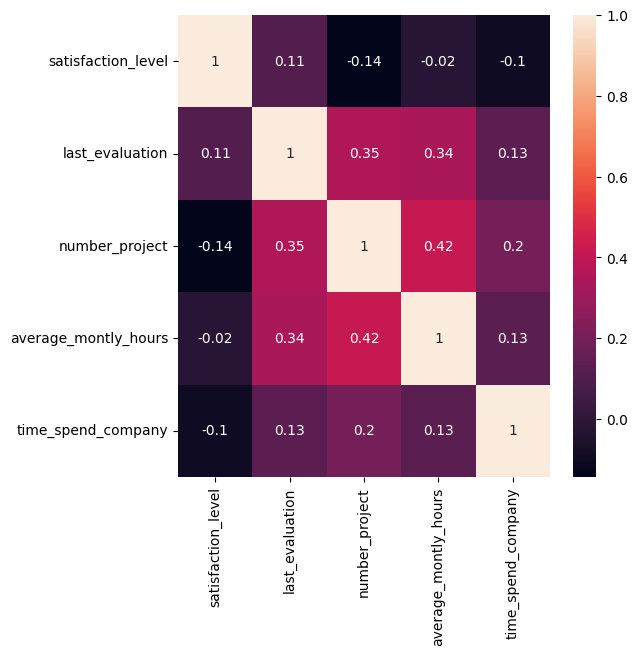

In [ ]:
# La matriz de correlación de las varaibles numéricas nos indica que no se
# observan correlaciones altas entre ellas, es decir, se tiene una
# multicolinealidad baja:

correlations = df_Tnum[num_list].corr()
f, ax = plt.subplots(figsize = (6,6))
sns.heatmap(correlations, annot = True);

# **KPrototype : KMeans para variables numéricas y categóricas.**



#### **Recordemos que KMeans es una técnica para variables numéricas ya que está basada en la distancia (por ejemplo, euclideana) entre puntos. Para el caso de variables categóricas, dicha "distancia" será ahora la Moda y la similitud será la diferencia entre los distintos niveles.**

#### **Para ello debemos usar la librería KModes para datos solamente categóricos, o bien KPrototype, para conjunto de datos mixtos (numéricos y categóricos).**

#### **Toma en cuenta que debido al proceso de estar manejando variables numéricas y categóricas, el método de KPrototype puede tomar varios minutos en terminarse.**

In [ ]:
!pip install kmodes   # Debemos instalar KModes, que necesitaremos para KPrototype.

In [ ]:
from kmodes.kprototypes import KPrototypes

Veamos un extracto del dataframe:

In [ ]:
df_Tnum.head().T

,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


Vemos la información de las variables categóricas:

In [ ]:
df_Tnum['Work_accident'].value_counts()

Work_accident
0    12831
1     2169
Name: count, dtype: int64

In [ ]:
df_Tnum['promotion_last_5years'].value_counts()

promotion_last_5years
0    14681
1      319
Name: count, dtype: int64

In [ ]:
df_Tnum['sales'].value_counts()

sales
sales          4141
technical      2720
support        2229
IT             1227
product_mng     902
marketing       858
RandD           787
accounting      767
hr              739
management      630
Name: count, dtype: int64

In [ ]:
df_Tnum['salary'].value_counts()

salary
low       7317
medium    6446
high      1237
Name: count, dtype: int64

#### **Método de inicialización de KModes y KPrototype:**

Existen varias técnicas de inicialización de las variables catagóricas, en particular usaremos la llamada "Huang", la cual selecciona los primeros "K" registros distintos para iniciar con "K-Modes". Recordemos que en KModes se utuliza la moda en lugar del promedio aritmético que se aplica en las numéricas.

La "distancia" o "diferencia" entre un dato y un centroide será la suma de la diferencia de la parte numérica más la parte categórica. La parte numérica se calcula con la distancia euclideana usual sobre las coordenadas numéricas. Y la parte categórica mide la distancia de un dato a un centroide, como la cantidad de coordenadas categóricas diferentes dentre el dato y el centroide.

Las variables categóricas no requieren ser transformadas, solamente hay que indicar cuáles son y el algoritmo se encargará de tratarlas como tales.

Puedes consultar la siguiente liga de la documentación:

https://kprototypes.readthedocs.io/en/latest/api.html

Text(0, 0.5, 'Inercia')

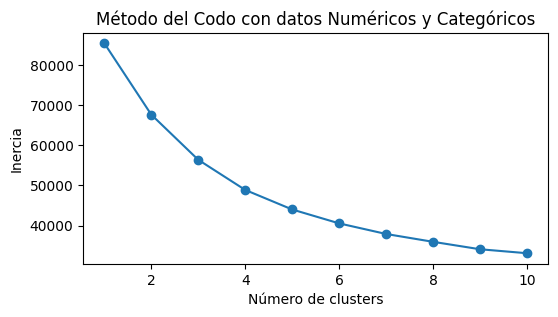

In [ ]:
# Apliquemos el método de KMeans para datos mixtos (numéricos y categóricos)

#                                                            ...esta celda tarda 45 mins aprox en Google-Colab ...

ssecat = []    # Suma del cuadrado de los errores numéricos y categóricos .

k_list = range(1, 11)

cat_cols = [5,6,7,8]  # cat_list

for k in k_list:
    kp = KPrototypes(n_clusters=k, init='Huang', n_init=5)    # Inicializamos KMeans-con-varaibles-Mixtas
    kp.fit(df_Tnum , categorical=cat_cols)     # debemos indicarle cuáles son las variables categóricas.
    ssecat.append([k, kp.cost_])   # Calculamos la incercia de cada dato, numérica y categórica conjunta.


oca_results_scale = pd.DataFrame({'Cluster': range(1,11), 'SSE-CAT': ssecat})

plt.figure(figsize=(6,3))
plt.plot(pd.DataFrame(ssecat)[0], pd.DataFrame(ssecat)[1], marker='o')
plt.title('Método del Codo con datos Numéricos y Categóricos')
plt.xlabel('Número de clusters')
plt.ylabel('Inercia')

# **Ejercicio - 1:**

Veamos la tabla de resultados generada en el proceso iterativo de KPrototypes

In [ ]:
oca_results_scale

,Cluster,SSE-CAT
0,1,"[1, 85514.99999999964]"
1,2,"[2, 67697.15782516438]"
2,3,"[3, 56421.38193226099]"
3,4,"[4, 48895.71822428768]"
4,5,"[5, 44015.52523159321]"
5,6,"[6, 40544.744577080644]"
6,7,"[7, 37898.50966888639]"
7,8,"[8, 35941.12642046554]"
8,9,"[9, 34085.8593305581]"
9,10,"[10, 33095.34982132607]"


En la gráfica de codo, no hay una contundencia como nos gustaría de la formación de la inflexión, pero en $k = 4$ se puede ver que hay una ligera formación del codo

In [ ]:
# Selecciona el valor del entero "k" de kMeans, la cantidad de subgrupos o
# cúmulos (clusters) que creas adecuado siguiendo la técnica del codo
# y de acuerdo a la gráfica obtenida en la celda anterior:


# ************* Inlcuye aquí tu código:*****************************

k_clusters_KProto = 4

# *********** Aquí termina la sección de agregar código *************

print("El numero de clústers que se considera ideal es", k_clusters_KProto)

El numero de clústers que se considera ideal es 4


Recordemos que el Autoencoder es una red neuronal artificial, por lo que ahora sí requerimos transformar también las variables categóricas.

In [ ]:
# Escalando la variable Ordinal:

df_Tnumord = df_Tnum.copy()

ordenc = OrdinalEncoder()
df_Tnumord[['salary']] = ordenc.fit_transform(df_Tnumord[['salary']])

df_Tnumord.head().T

,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,1.0,1.0,2.0,2.0,1.0


Las variables binarias las dejaremos como tales y la nominal aplicaremos one-hot-encoding con el método get_dummies() de Pandas:

In [ ]:
X_Tnumordnom = df_Tnumord.copy()   # transformemos la variable Nominal con las Dummies de Pandas.

X_Tnumordnom = pd.get_dummies(X_Tnumordnom, columns=['sales'], drop_first=True)

df_Tnumordnom = pd.DataFrame(X_Tnumordnom)

print(df_Tnumordnom.shape)
df_Tnumordnom.head().T

(15000, 17)


,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
salary,1.0,1.0,2.0,2.0,1.0
sales_RandD,False,False,False,False,False
sales_accounting,False,False,False,False,False


# **Modelo AUTOENCODER**

Veamos un extracto de el dataframe tidy que entrará a la fase de autoencoding

In [ ]:
df_Tnumordnom.head().T

,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
salary,1.0,1.0,2.0,2.0,1.0
sales_RandD,False,False,False,False,False
sales_accounting,False,False,False,False,False


In [ ]:
# Definamos una arquitectura Autoencoder de manera usual para el caso de
# búsqueda de conglomerados: iniciar en el Encoder incrementando las primeras
# capas densas ocultas para deshacer lo mayor posible la dependencia de los
# factores, para posteriormente proyectarlos al espacio latente Z de menor
# dimensión. Cuando decimos de menor dimensión, es con respecto a la dimensión
# de los factores de entrada. En particular usaremos aproximadamente la mitad
# de los nodos/factores de entrada (que son 17).
# Posteriormente el Decoder será un espejo del
# Encoder, salvo alguna capa que podemos eliminar para que no se tenga una
# simetría completa y obtengamos algo más que simplemente vectores muy
# similares a los iniciales de entrada.
# Cada capa densa la inicializamos con Xavier-Glorot y usamos ReLU como
# función de activación.
# Finalmente usamos Adam como optimizador y la suma de cuadrados para la
# función de costo.

input_factors = df_Tnumordnom.shape[1]  # cantidad de factores en los datos de entrada.
int_z_latent = 8     # Dimensión del espacio latente Z.
encoding_dim = k_clusters_KProto  # valor k que determinaste en el método del codo del Ejercicio 1.

print("El número de variables de entrada es: ", input_factors)
print("La dimensión de encoding será: ", encoding_dim)

El número de variables de entrada es:  17
La dimensión de encoding será:  4


In [ ]:
input_df = Input(shape=(input_factors, ))

In [ ]:
# Capas del ENCODER:
x = Dense(encoding_dim, activation='relu')(input_df)
x = Dense(400, activation='relu', kernel_initializer='glorot_uniform')(x)
x = Dense(400, activation='relu', kernel_initializer='glorot_uniform')(x)
x = Dense(1500, activation='relu', kernel_initializer='glorot_uniform')(x)

# ESPACIO LATENTE Z:
encoded = Dense(int_z_latent, activation = 'relu', kernel_initializer = 'glorot_uniform')(x)

# Capas del DECODER:
x = Dense(1500, activation = 'relu', kernel_initializer = 'glorot_uniform')(encoded)
x = Dense(400, activation = 'relu', kernel_initializer = 'glorot_uniform')(x)

decoded = Dense( input_factors, kernel_initializer = 'glorot_uniform')(x)

# Generamos los modelos Autoencoder y Encoder:
autoencoder = Model(input_df, decoded)  # Modelo Autoencoder: (entrada de datos iniciales) + (Encoder) + (espacio-Z-latente) + (Decoder).
encoder = Model(input_df, encoded)      # Modelo Encoder:  (entrada de datos iniciales) + (Encoder) + (espacio-Z-latente).

autoencoder.compile(optimizer = 'adam', loss = 'mean_squared_error')

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Pasamos al proceso de entrenamiento del Autoencoder.
# Aunque solo requeriremos en este ejercicio el Encoder, en el proceso debemos
# también generar el Decoder:

# NOTA: En la ejecución de este chunk nos arroja el siguiente error
# Failed to convert a NumPy array to a Tensor (Unsupported object type float)
# Por tanto hay que hacer una re-codificación de los datos
df_Tnumordnom = df_Tnumordnom.astype('float32')

autoencoder.fit(df_Tnumordnom, df_Tnumordnom, batch_size=256, epochs = 30, verbose = 1)


Epoch 1/30
59/59 [==============================] - 10s 91ms/step - loss: 0.2648
Epoch 2/30
59/59 [==============================] - 4s 60ms/step - loss: 0.1880
Epoch 3/30
59/59 [==============================] - 4s 72ms/step - loss: 0.1707
Epoch 4/30
59/59 [==============================] - 4s 75ms/step - loss: 0.1592
Epoch 5/30
59/59 [==============================] - 3s 55ms/step - loss: 0.1490
Epoch 6/30
59/59 [==============================] - 3s 59ms/step - loss: 0.1418
Epoch 7/30
59/59 [==============================] - 4s 76ms/step - loss: 0.1338
Epoch 8/30
59/59 [==============================] - 5s 79ms/step - loss: 0.1278
Epoch 9/30
59/59 [==============================] - 3s 55ms/step - loss: 0.1235
Epoch 10/30
59/59 [==============================] - 3s 54ms/step - loss: 0.1199
Epoch 11/30
59/59 [==============================] - 4s 63ms/step - loss: 0.1168
Epoch 12/30
59/59 [==============================] - 6s 96ms/step - loss: 0.1150
Epoch 13/30
59/59 [=================

In [ ]:
pred_Z_latente = encoder.predict(df_Tnumordnom)   # generamos los vectores en el espacio latente Z a la salida del Encoder.

469/469 [==============================] - 2s 4ms/step


Veamos qué tipo de objeto guarda la variable `pred_Z_latente`

In [ ]:
type(pred_Z_latente)

numpy.ndarray

In [ ]:
pred_Z_latente.shape   # dimensión de los vectores en el espacio latente

(15000, 8)

Es decir, se transformaron los datos de su dimensión original a un espacio de dimensión 8

Ahora, con base a los vectores latentes obtenidos con el Autoencoder, apliquemos kMeans (con el método usual para variables numéricas) para seleccionar cuántos cúmulos podríamos generar con estos vectores para obtener información sobre los empleados de la empresa y su potencial salida de la misma.

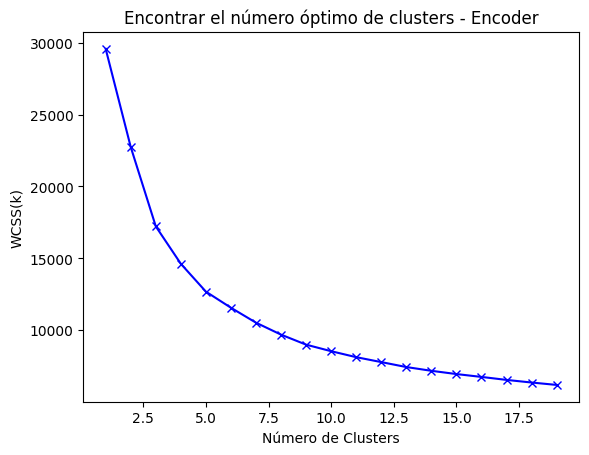

In [ ]:
scores_Z = []                                          #    tarda menos de 1 min

range_values = range(1,20)

for i in range_values:
    kmeans = KMeans(n_clusters = i, n_init=10)
    kmeans.fit(pred_Z_latente)
    scores_Z.append(kmeans.inertia_)   # WCSS : within-cluster sum of square


plt.plot(range_values, scores_Z, 'bx-')
plt.title("Encontrar el número óptimo de clusters - Encoder")
plt.xlabel("Número de Clusters")
plt.ylabel("WCSS(k)")
plt.show()

In [ ]:
pd.DataFrame(list(zip(range_values, scores_Z)),
               columns =['numero', 'scoreZ'])

,numero,scoreZ
0,1,29569.615234
1,2,22740.992188
2,3,17219.988281
3,4,14616.970703
4,5,12680.136719
5,6,11559.574219
6,7,10519.811523
7,8,9687.894531
8,9,8990.938477
9,10,8535.593750


Basándonos en el método del codo, podríamos decir que 5, 6 o 7 cúmulos serían adecuados.

Veamos que valor de K obtenemos con la técnica Silhouette.

Si no conoces esta técnica, puedes consultar la documentación correspondiente en la siguiente liga:

https://www.scikit-yb.org/en/latest/api/cluster/silhouette.html


In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer

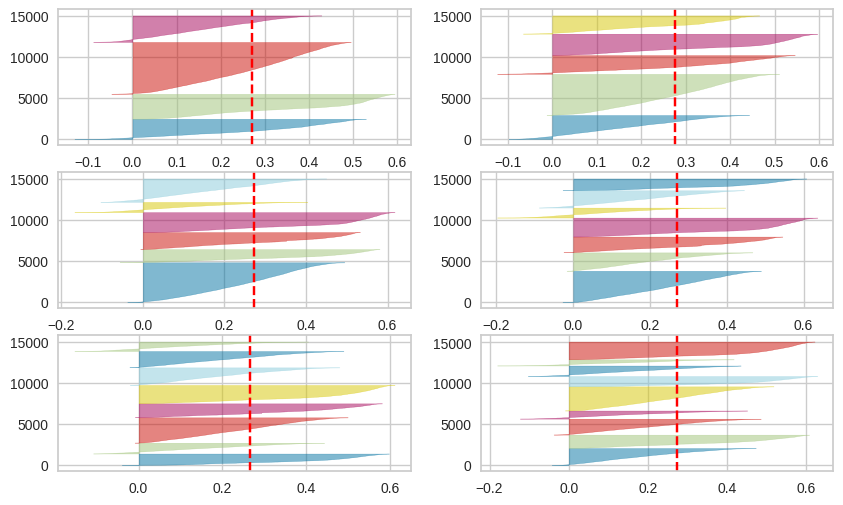

In [ ]:
fig, ax = plt.subplots(3, 2, figsize=(10,6))            # tarda se 1 a 2 mins

for i in [4,5,6,7,8,9]:
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=7)
    q, mod = divmod(i-2, 2)

    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(pred_Z_latente)

# **Ejercicio - 2:**

Recuérdese que se están considerando 5, 6 ó 7 clústers (según el gráfico de códo basado en el autoencoder). Como con k = 6 y k = 7 se ven algunos errores de clasificación en el clúster amarillo; y en k = 5 el tamaño de los clústers parece equilibrado, se considerarán 5 clústers.

In [ ]:
# Selecciona el valor del entero "k" del número de cúmulos con base a lo
# observado los gráfica de la técnica del codo y de silhouette.
# Observa que no necesriamente deben coincidir los valores observados
# por ambos métodos, por lo que deberás elegir el que consideres
# más adecuado:


# ************* Inlcuye aquí tu código:*****************************

k_clusters_Z_latente = 5

print("El numero de clústers que se considera ideal, usando la técnica de silueta, es", k_clusters_Z_latente)
# *********** Aquí termina la sección de agregar código *************


El numero de clústers que se considera ideal, usando la técnica de silueta, es 5


In [ ]:
km_Z_latent = KMeans(n_clusters= k_clusters_Z_latente,    # valor que seleccionaste en el Ejercicio 2.
                     n_init=10,    # número de veces que selecciona vectores de inicialización y se queda con el de menor inercia.
                     max_iter=500,
                     init='k-means++').fit(pred_Z_latente)

labels_Z_latent = km_Z_latent.labels_    # etiquetas para cada registro-renglón de los datos de entrada.

In [ ]:
pd.DataFrame(labels_Z_latent).value_counts()   # Tamaño de los clusters obtenidos con el método del Autoencoder.

0    5002
3    2918
4    2597
2    2271
1    2212
Name: count, dtype: int64

In [ ]:
# Apliquemos PCA ahora a los vectores latentes obtenidos para proyectarlos y
# visualizarlos en un espacio de dimensión 2:

pca = PCA(n_components=2)
princ_comp = pca.fit_transform(pred_Z_latente)
pca_df = pd.DataFrame(data = princ_comp, columns=["pca1", "pca2"])
pca_df = pd.concat([pca_df, pd.DataFrame({"cluster":labels_Z_latent})], axis = 1)
pca_df.head(3)

,pca1,pca2,cluster
0,1.492249,2.402863,4
1,0.275660,1.102363,4
2,-0.075677,-1.408803,1


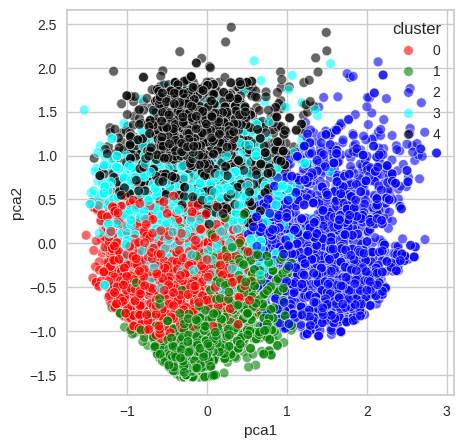

In [ ]:
plt.figure(figsize=(5,5))
ax = sns.scatterplot(x="pca1", y = "pca2", hue="cluster", data = pca_df,
                     alpha=0.6,
                     palette=["red", "green", "blue","cyan", "black",'pink','orange', "yellow"])
plt.show()

In [ ]:
# Concatenamos la información de las etiquetas de cada registro del dataframe de
# entrada indicando además en qué cúmulo se encuentran.
# Es importante tener los valores iniciales sin transformar con la información
# de a qué cumulo pertenece para poder darles un mejor significado desde el
# punto de vista del negocio, en este caso sobre cada factor y su impacto en
# la posible salida de un empleado.

cluster_Z_latent_perfiles = pd.concat([dftodos, pd.DataFrame({'autoencoder_clusters':labels_Z_latent})], axis=1 )

cluster_Z_latent_perfiles.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,sales,salary,autoencoder_clusters
0,0.09,0.36,2,96,2,0,0,sales,low,4
1,0.38,0.53,2,157,3,0,0,sales,low,4
2,0.80,0.86,5,262,6,0,0,sales,medium,1
3,0.11,0.88,7,272,4,0,0,sales,medium,2
4,0.72,0.87,5,223,5,0,0,sales,low,1


In [ ]:
cluster_Z_latent_perfiles['autoencoder_clusters'].unique()

array([4, 1, 2, 0, 3], dtype=int32)

Se puede observar que ahora hay una columna donde se indica el clúster al que pertenece cada observación, etiquetados con los números 0, 1, 2, 3 y 4 (que efectivamente son 5 clústers como se había requerido)

# **PCA - Análisis de Componentes Principales**



Aplicaremos ahora la técnica PCA a los datos iniciales para generar igualmente cúmulos y compararlo con lo obtenido con la técnica de Autoencoder previamente vista. Esta técnica es más conocida y generalemente la que se aplica en primera instancia en un problema de agrupamiento (clustering).

En este caso lo haremos tomando directamente las decisiones sobre los gráficos que estarmos generando:

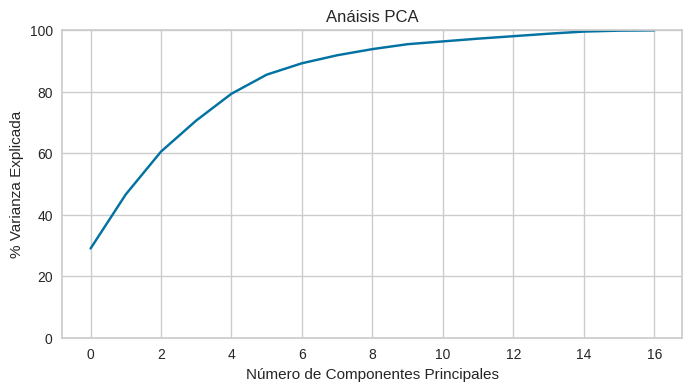

In [ ]:
# Consideremos el DataFrame con los 17 vectores transformados
# y apliquemos PCA con todos ellos para ver qué cantidad de
# componenes principales podrían ser suficientes para un análisis
# de relación factores y cúmulos que formaremos:

pca = PCA(n_components= df_Tnumordnom.shape[1], random_state=5)
pca.fit(df_Tnumordnom)

variance = pca.explained_variance_ratio_
var = np.cumsum(np.round(variance, 3)*100)

plt.figure(figsize=(8,4))
plt.ylabel('% Varianza Explicada')
plt.xlabel('Número de Componentes Principales')
plt.title('Anáisis PCA')
plt.ylim(0,100.1)
plt.plot(var);

#### **Vemos que con 4 o 6 componentes principales se explica aproximadamente entre el 80% y 90% de su varianza.**

#### **Selecconaremos el valor de 6 componentes principales (que implica cerca del 90% de la variabilidad de los datos) para fines de este ejercicio y a continuación veamos cuántos cúmulos podrían ser adecuados usar al aplicar el método de conglomerados (clustering).**

Text(0, 0.5, 'Inercia')

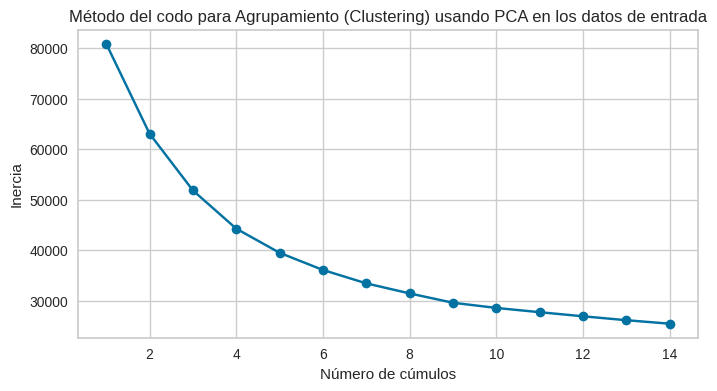

In [ ]:
                                                            #  tarda menos de 1 min
pca = PCA(n_components=6)    # seleccionamos 6 componentes principales que tienen un 90% de la varibilidad total
pca_T = pca.fit_transform(df_Tnumordnom)
pca_df_T = pd.DataFrame(pca_T, columns=['pc1','pc2','pc3','pc4','pc5','pc6'])


sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k,n_init=7,random_state=7)
    km.fit(pca_df_T)
    sse.append([k, km.inertia_])

pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(8,4))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Método del codo para Agrupamiento (Clustering) usando PCA en los datos de entrada')
plt.xlabel('Número de cúmulos')
plt.ylabel('Inercia')

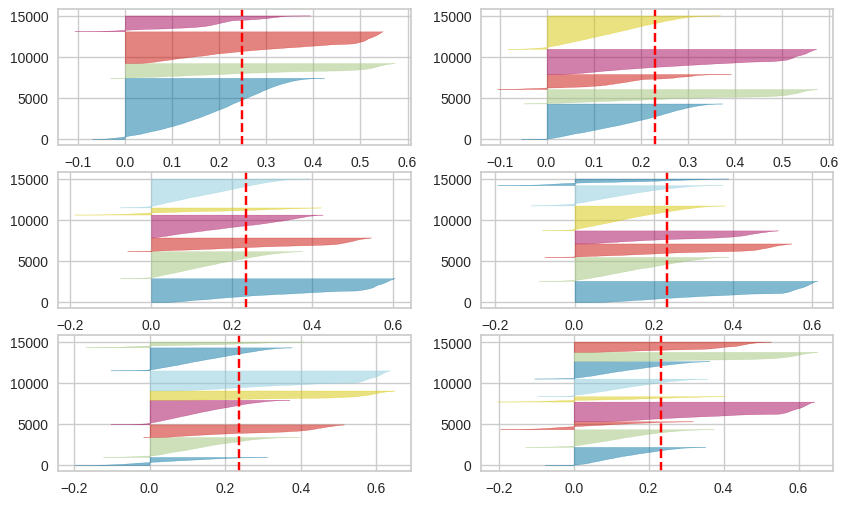

In [ ]:
# Veamos también el método Silhouette a ver que nos dice:

fig, ax = plt.subplots(3, 2, figsize=(10,6))                            # tarda como 1 min

for i in [4,5,6,7,8,9]:
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=7)
    q, mod = divmod(i-2, 2)

    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(pca_df_T)

De ambos análisis/gráficos observamos varias opciones, pero para fines de este ejercicio seleccionaremos el valor de 5 para la cantidad de cúmulos que consideamos más adecuada con estos 6 vectores de componentes principales que generamos.

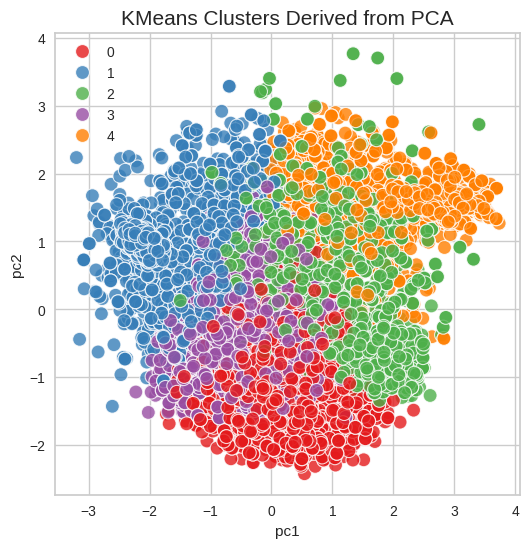

In [ ]:
kmeans_pca_T = KMeans(n_clusters=5, n_init=7, max_iter=400, init='k-means++').fit(pca_df_T)

labels_pca_T = kmeans_pca_T.labels_

clusters_pca_T = pd.concat([pca_df_T, pd.DataFrame({'pca_clusters':labels_pca_T})], axis=1)



# Grafiquemos las primeras 2 componentes principales del método PCA :
plt.figure(figsize = (6,6))
sns.scatterplot(x=clusters_pca_T['pc1'],
                y=clusters_pca_T['pc2'],
                hue=labels_pca_T,
                palette='Set1',
                s=100,
                alpha=0.8
                ).set_title('KMeans Clusters Derived from PCA', fontsize=15)

plt.legend()
plt.show()

In [ ]:
# Concatenamos ahora el dataFrame de datos originales con los cúmulos identificados
# mediante las componentes principales de los datos de entrada:

cluster_pca_perfiles = pd.concat([dftodos, pd.DataFrame(clusters_pca_T['pca_clusters'])], axis=1 )
cluster_pca_perfiles.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,sales,salary,pca_clusters
0,0.09,0.36,2,96,2,0,0,sales,low,1
1,0.38,0.53,2,157,3,0,0,sales,low,1
2,0.80,0.86,5,262,6,0,0,sales,medium,2
3,0.11,0.88,7,272,4,0,0,sales,medium,4
4,0.72,0.87,5,223,5,0,0,sales,low,2


In [ ]:
cluster_pca_perfiles['pca_clusters'].unique()

array([1, 2, 4, 0, 3], dtype=int32)

Se puede observar que ahora hay una columna donde se indica el clúster al que pertenece cada observación, pero ahora con una proyección de las dimensiones en un espacio afin vía PCA, etiquetados con los números 0, 1, 2, 3 y 4 (que efectivamente son 5 clústers como se había requerido)

# **Relaciones entre factores de acuerdo a los cúmulos**

In [ ]:
cluster_Z_latent_perfiles.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,sales,salary,autoencoder_clusters
0,0.09,0.36,2,96,2,0,0,sales,low,4
1,0.38,0.53,2,157,3,0,0,sales,low,4
2,0.80,0.86,5,262,6,0,0,sales,medium,1
3,0.11,0.88,7,272,4,0,0,sales,medium,2
4,0.72,0.87,5,223,5,0,0,sales,low,1


In [ ]:
cluster_pca_perfiles.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,sales,salary,pca_clusters
0,0.09,0.36,2,96,2,0,0,sales,low,1
1,0.38,0.53,2,157,3,0,0,sales,low,1
2,0.80,0.86,5,262,6,0,0,sales,medium,2
3,0.11,0.88,7,272,4,0,0,sales,medium,4
4,0.72,0.87,5,223,5,0,0,sales,low,2


<Figure size 1500x1000 with 0 Axes>

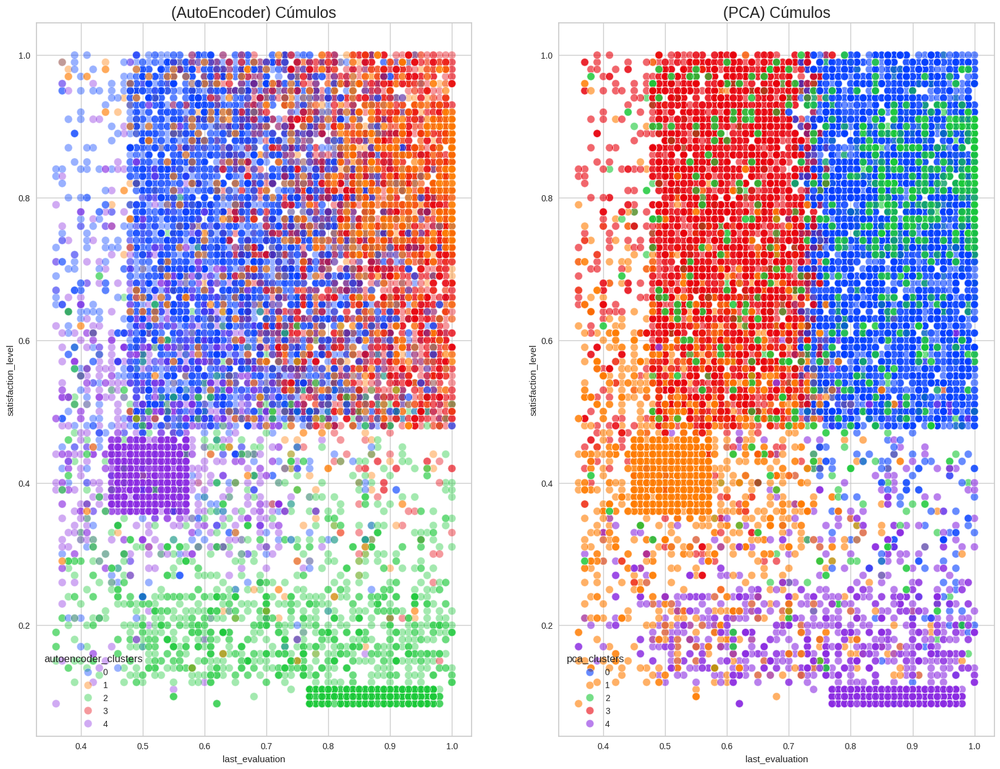

In [ ]:
fact1 = 'last_evaluation'
fact2 = 'satisfaction_level'

mi_scatterplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2);

In [ ]:
box = (cluster_Z_latent_perfiles['last_evaluation'] < 0.56 ) & (cluster_Z_latent_perfiles['last_evaluation'] > 0.44) & (cluster_Z_latent_perfiles['satisfaction_level'] < 0.47 ) & (cluster_Z_latent_perfiles['satisfaction_level'] > 0.36)

cluster_Z_latent_perfiles[box]

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,sales,salary,autoencoder_clusters
1,0.38,0.53,2,157,3,0,0,sales,low,4
5,0.37,0.52,2,159,3,0,0,sales,low,4
6,0.41,0.50,2,153,3,0,0,sales,low,4
10,0.42,0.53,2,142,3,0,0,sales,low,4
11,0.45,0.54,2,135,3,0,0,sales,low,4
...,...,...,...,...,...,...,...,...,...,...
14989,0.46,0.55,2,145,3,0,0,technical,low,4
14993,0.40,0.48,2,155,3,0,0,support,low,4
14996,0.37,0.48,2,160,3,0,0,support,low,4
14997,0.37,0.53,2,143,3,0,0,support,low,4


# **Ejercicio - 3:**

### **Con base a los gráficos dados en los siguientes pares de factores y en relación a los subgrupos o cúmulos observados por el método de Autoencoders y el de PCA, incluye alguna interpretación del mismo que ayude a entender mejor al departamento de recursos humanos el ambiente de trabajo dentro de la empresa.**

<Figure size 1500x1000 with 0 Axes>

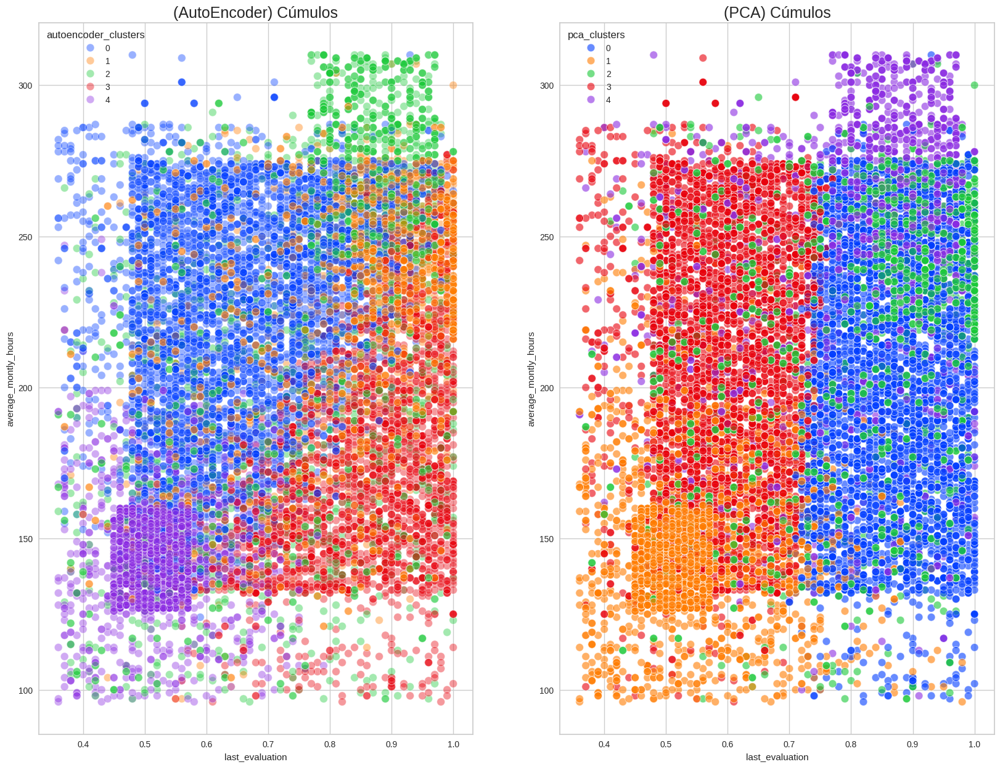

In [ ]:
# Ejercicio 3a:

fact1 = 'last_evaluation'
fact2 = 'average_montly_hours'

mi_scatterplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3a:**

++++++++ Inicia la sección de agregar texto: +++++++++++


En un primer análisis logramos apreciar que no existe con claridad una fuerte relación entre contar con buen desempeño y el número promedio de horas que se laboran semanalmente para la mayor parte de los colaboradores. No obstante existen dos grupos que valdría la pena estudiar a fondo, que son contrarios a la idea principal. Estos grupos claramente se identifican con tener las peores y mejores calificaciones y al mismo tiempo ser grupos de personas que trabajan o muy poco o demasiado con respecto al resto.


++++++++ Termina la sección de agregar texto. +++++++++++

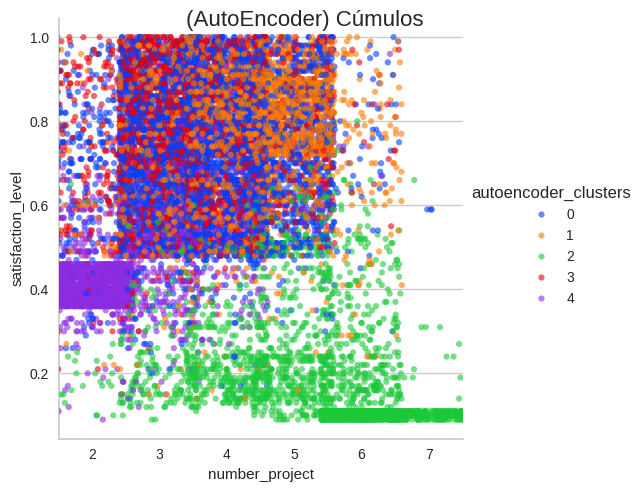

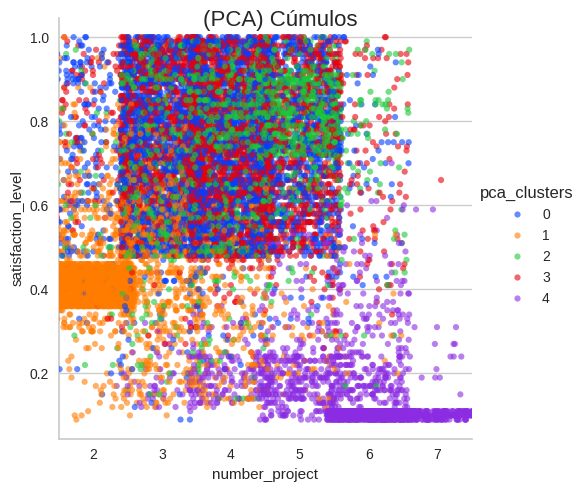

In [ ]:
# Ejercicio 3b:

fact1 = 'number_project'
fact2 = 'satisfaction_level'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3b:**

++++++++ Inicia la sección de agregar texto: +++++++++++


En un primer acercamiento, logramos observar que el nivel de satisfacción del empleado no viene relacionado de alguna forma con la totalidad de proyectos en los que ha participado a lo largo de la empresa en la mayor parte de los empleado. Sin embargo, conviene rescatar que se identifican al menos 3 grupos que demuestran reaccionar a esta variable, en este caso los llamaremos : Trabajadores de alto impacto, trabajadores cómodos y trabajadores incómodos de bajo impacto. Para un análisis más detallado, conviene profundizar con un análisis de las características de estos grupos.


++++++++ Termina la sección de agregar texto. +++++++++++

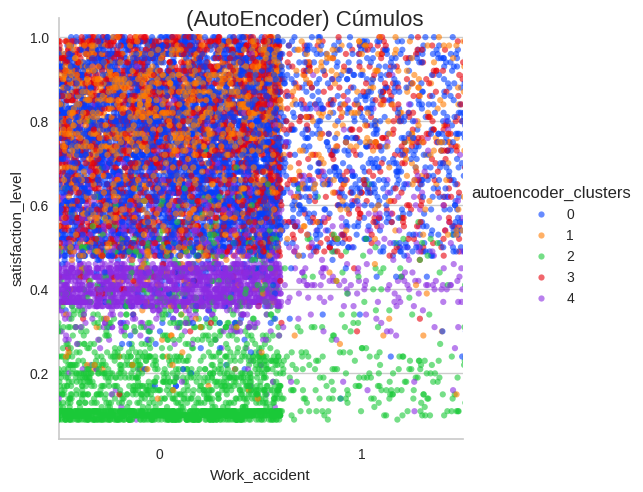

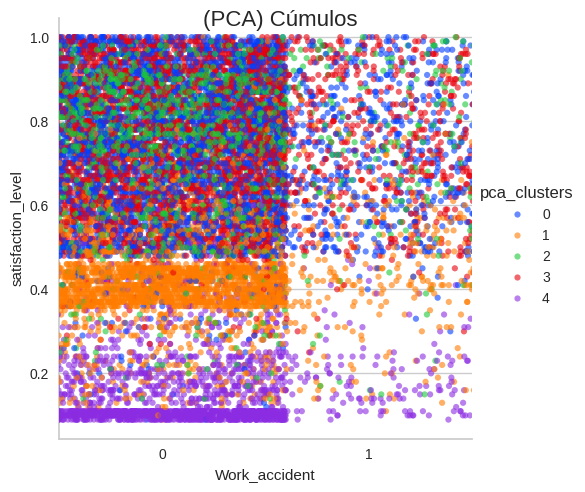

In [ ]:
# Ejercicio 3c:


fact1 = 'Work_accident'
fact2 = 'satisfaction_level'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3c:**

++++++++ Inicia la sección de agregar texto: +++++++++++


Este gráfico no da mucha información para sacar conclusiones. Sin embargo, se logran identificar puntualmente grupo de trabajadores que ante la desgracia de haber tenido un accidente cuentan con un nivel de satisfacción mayor que otros empleados. Seguramente esta conducta se deba a que en otros factores tienen mejores resultados, como quizás en el sueldo o aumentos.


++++++++ Termina la sección de agregar texto. +++++++++++

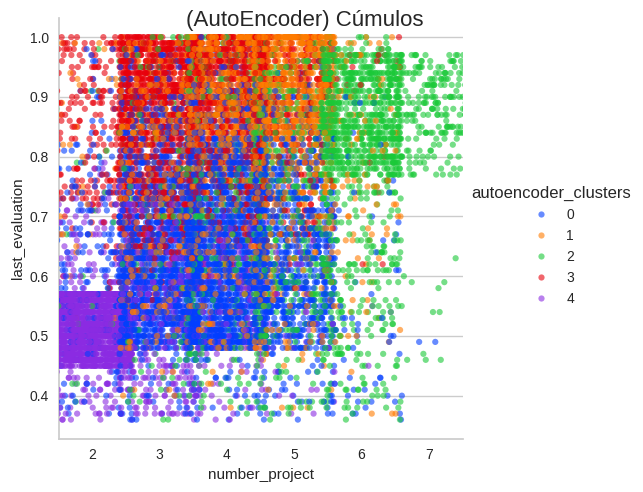

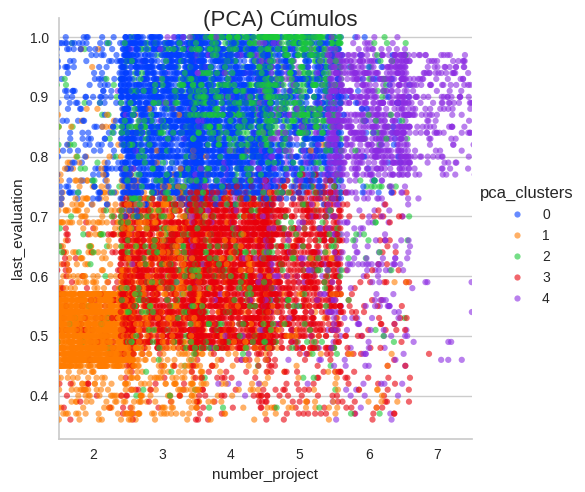

In [ ]:
# Ejercicio 3d:

fact1 = 'number_project'
fact2 = 'last_evaluation'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3d:**

++++++++ Inicia la sección de agregar texto: +++++++++++


Esta información nos permite sacar algunas conclusiones. La primera conclusión es que el personal que ha tenido la oportunidad o se le han encomendado más proyectos durante su tiempo en la organización tienden a ser empleados con mejores desempeños. A estos dos grupos pudiéramos nombrarlos de la siguiente manera bajo esta premisa: (1) Personal de bajo desempeño y (2)Personal de alto desempeño. Fuera de estos dos grupos también existen dos grupos excluyentes que posiblemente se vean influenciados por otra características que influye en el desempeño de los mismos.


++++++++ Termina la sección de agregar texto. +++++++++++

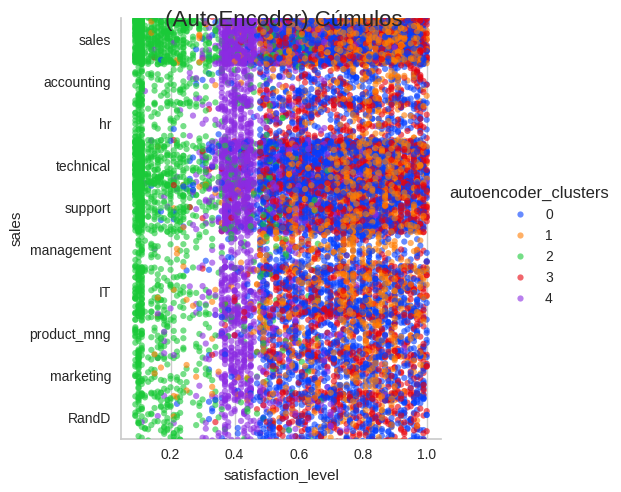

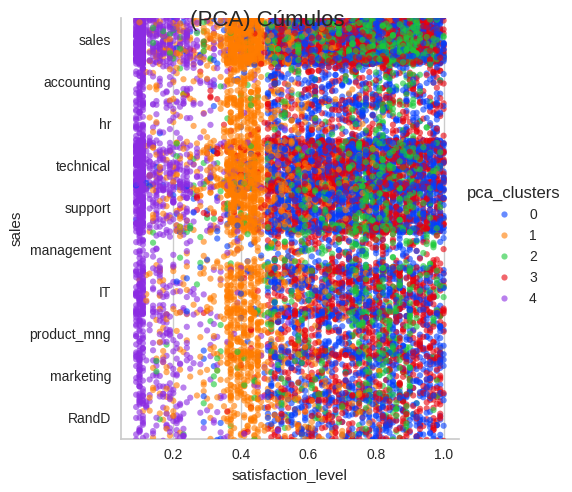

In [ ]:
# Ejercicio 3e:

fact2 = 'sales'
fact1 = 'satisfaction_level'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3e:**

++++++++ Inicia la sección de agregar texto: +++++++++++


Se puede observar que hay sólo un clúster con muy bajos niveles de satisfacción, PERO en dicho clúster hay integrantes de todas las áreas de la empresa.  De hecho, también se puede ver que hay un clúster con bajo nivel de satisfacción, pero también con miembros de toda la organización. Quizá evaluar analizar estos dos grupos como uno solo (empleados con satisfacción menor a 0.45) podría llevar a alguna política asociada a la satisfacción de los empleados.



++++++++ Termina la sección de agregar texto. +++++++++++

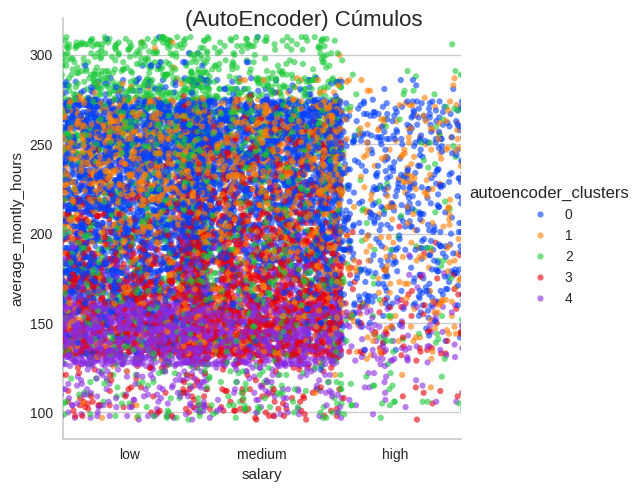

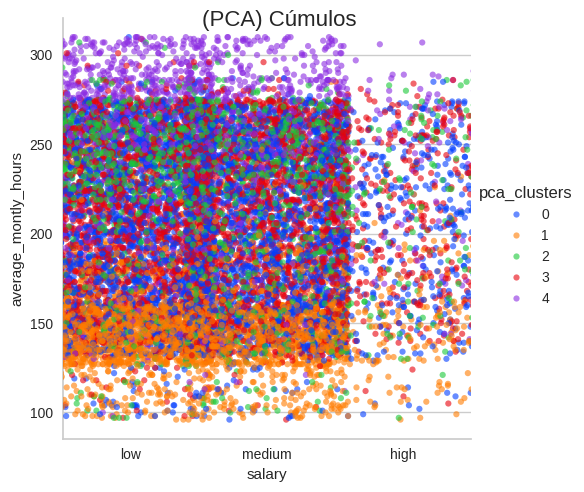

In [ ]:
# Ejercicio 3f:


fact1 = 'salary'
fact2 = 'average_montly_hours'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3f:**

++++++++ Inicia la sección de agregar texto: +++++++++++


El gráfico nos da información útil para diagnosticar que dentro de la empresa existen grupos menos favorecidos salarialmente considerando el total de horas que trabaja en promedio. Empezando con los tipos de empleados, pudieramos realizar la siguiente clasificación: Empleados sobrecompensados, Empleados privilegiados y Empleados mal compensados. Cabe señalar que esta última categoría es el grupo de empleados que pocas veces logra recibir altos salarios, por otro lado, los trabajadores Elite tienden a ser los que alcanzan los mejores sueldos.


++++++++ Termina la sección de agregar texto. +++++++++++

## **Ejercicio 3g:**

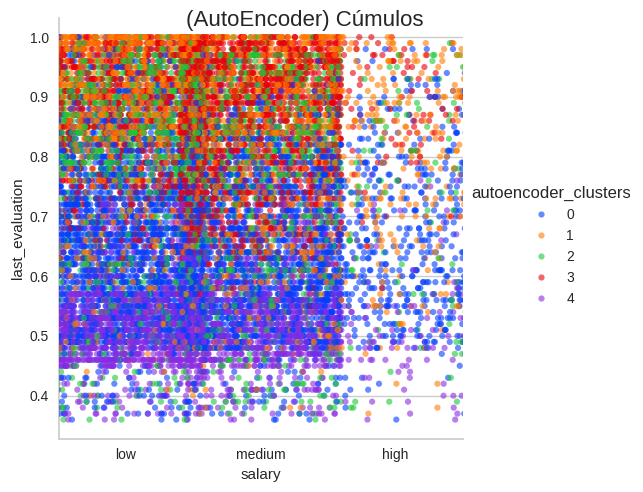

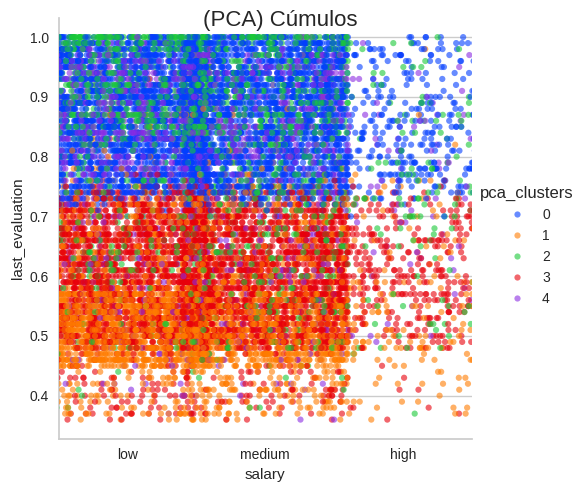

In [ ]:
# Incluye algún otro gráfico y tus comentarios de otra relación entre variables
# que consideres proporcione información importante al problema.


# ******************** Incluuye a continuación tu código **********************

fact1 = 'salary'
fact2 = 'last_evaluation'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)


# *********************** Termina sección para agregar código *****************



Logramos observar que dentro de la organización existen clientes que a pesar de tener sueldos altos arrojan resultados de desempeño bastante malos. Este es un grupo mayoritario pero que vale la pena conocer a más detalle. Por otro lado, observamos que existen grupos donde los desempeños son mejores pero que no logran romper la barrera de sueldos altos. Finalmente observamos los empleados de salarios medios que cuentan con excelentes notas. Este grupo es el que tienden a moverse también dentro de los sueldos más altos. Pudiéramos clasificar estos grupos dentro de las siguiente categorías. Empleados con Bajo Potencial, Empleados con Potencial y Empleados del Futuro. Estas categorías se aplican derivado del desempeño que han tenido y la influencia que logra verse en función del sueldo, por lo que pudiéramos decir que estos empleados entre más les pagues mejores resultados darán a la compañía.

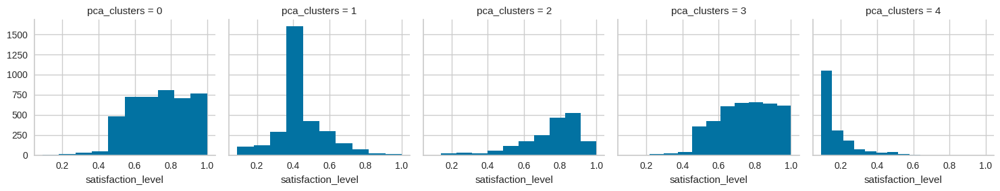

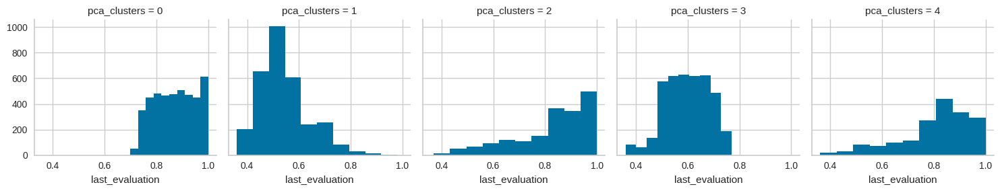

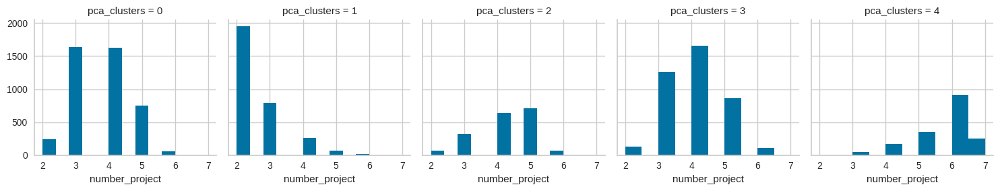

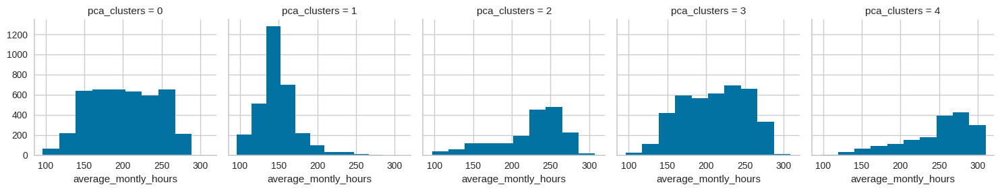

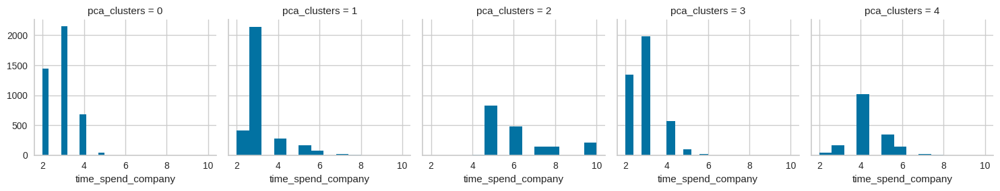

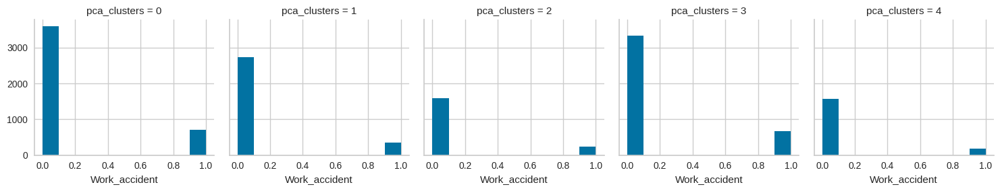

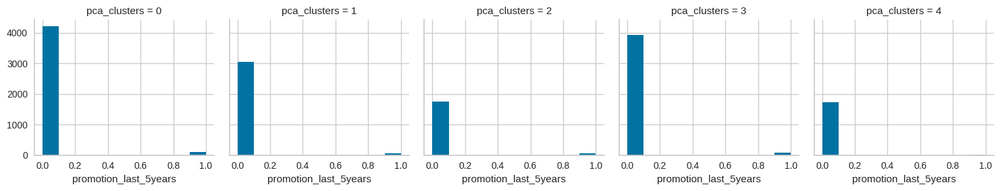

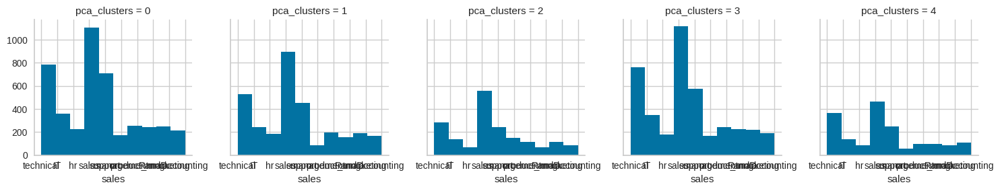

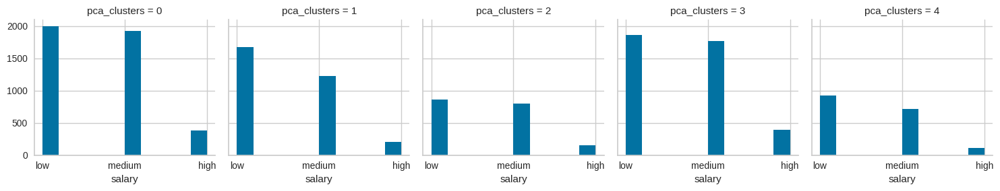

In [ ]:
# Podemos obtener algunos diagramas adicionales que nos ayuden a entender
# mejor cada cúmulo y su relación con los factores que la forman.
# Sabemos que exiten una gran variedad de otros tipos e gráficos.
# En particular podemos mostrar los de los cúmulos obtenidos con el método
# de autoencoders solo como muestra y a manera de complemento de la
# información que hemos obtenida con los gráficos anteriores:

for c in cluster_pca_perfiles.iloc[:,:9]:
    grid = sns.FacetGrid(cluster_pca_perfiles, col='pca_clusters')
    grid.map(plt.hist, c)

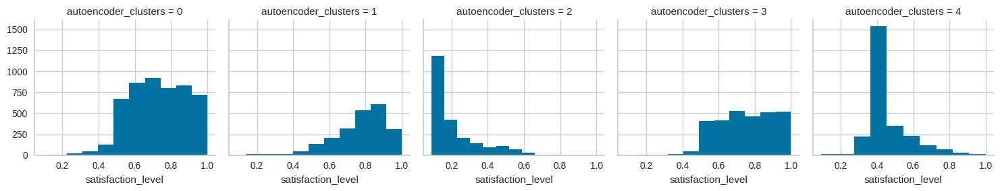

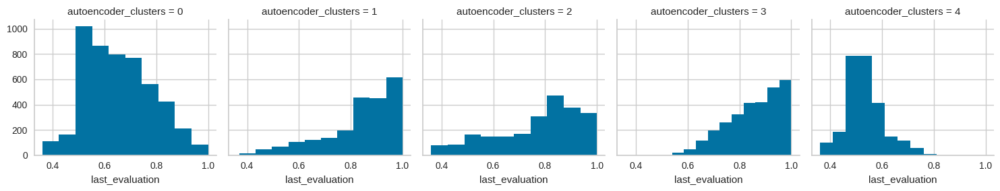

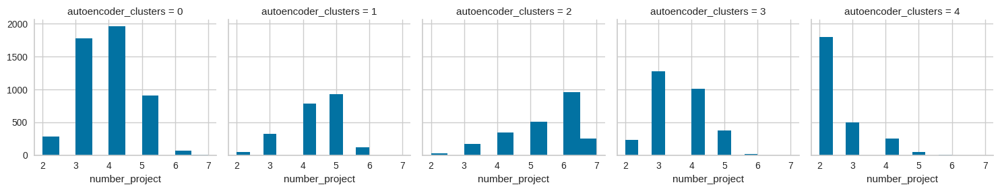

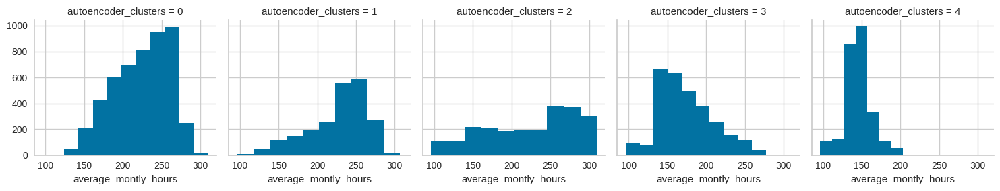

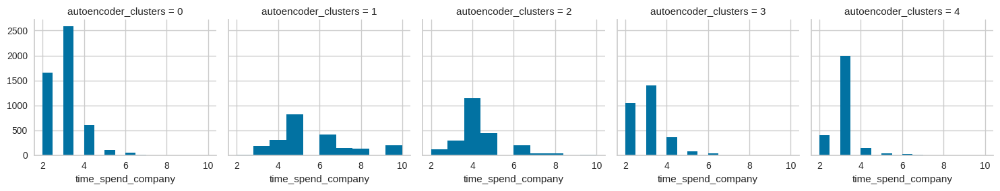

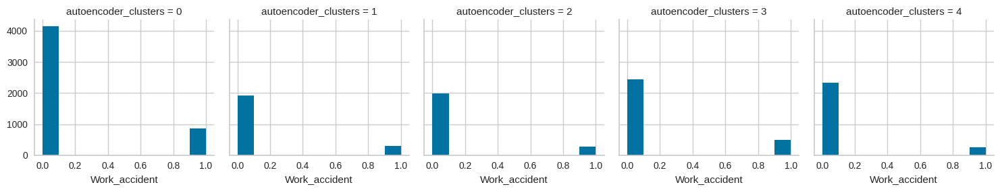

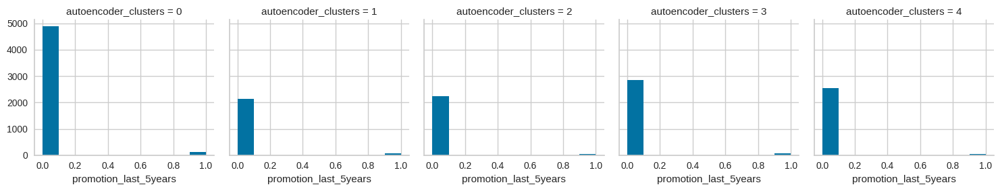

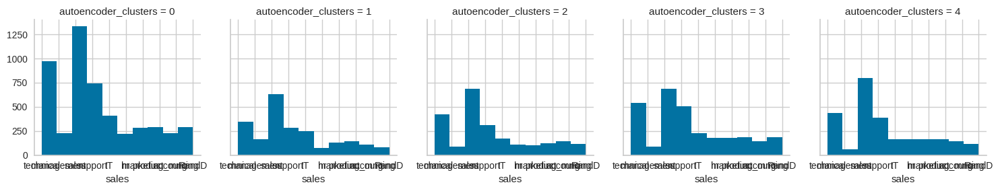

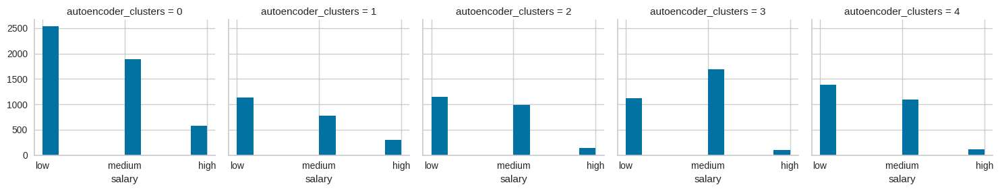

In [ ]:
# Se puede obtener representaciones de frecuencia también basada en la clasificación hecha con las dimensiones
# transformadas vía autoencoders

for c in cluster_Z_latent_perfiles.iloc[:,:9]:
    grid = sns.FacetGrid(cluster_Z_latent_perfiles, col='autoencoder_clusters')
    grid.map(plt.hist, c)

# **Ejercicio - 4:**

#### **Incluye tus conclusiones y comentarios finales de la Actividad:**

++++++++ Inicia la sección de agregar texto: +++++++++++

+ Las dimensiones `satisfaction_level` y `last_evaluation` son ambas importantes para el proceso de clusterización, pues tanto en la transformación del espacio vía PCA como en la transformación del espacio vía autoencoders (variables latentes) los histogramas son diferentes dependiendo del clúster. Vía PCA le cuesta trabajo distinguir entre el clúster 0 y el 3; y vía autoencoders le cuesta trabajo distinguir entre los clústes 1 y 3.

+ A ambas transformaciones no ayudan a distinguir en la dimensión de `sales` (pues todas las gráficas de barras tienen formas similares), i.e. en el área a la que pertenecen en la empresa. Hecho que complica la interpretación por área y lleva a que en los clústers haya individuos de todas las áreas.

+ La variable `promotion_last_5years` tampoco se puede interpretar en la clusterización (quizá se debe al bajo número de observaciones que han tenido una promoción). Tampoco la variable `Work_accident` es útil en términos de interpretación para la formación de los grupos pues en todos los hubo personas accidentadas y la proporción de accidentados en todos los clústers es similar a la proporción de toda la muestra (sin considerar clusterización).

+ Analizando la variable `time_spend_company` se puede ver que bajo ambas metodologías, hay 4 grupos con un gran número personas con menos de 6 años de antigüedad y 1 grupo con observaciones con más de 6 años de antigüedad. Esto podría ayudar a interpretar al menos a uno de los clústers: los de mucha antigüedad.

+ En nivel salarial tampoco es marcador del clúster (en ninguno de los dos métodos). Esto se puede observar en que en todos los clústers hay personas de los tres niveles salariales con proporciones similares a las de la muestra completa.

+ Una segmentación del número de proyectos también se puede considerar como marcador del clúster, pues bajo ambos métodos hay solo un clúster que tiene personas que están involucradas en 7 proyectos. Identificar dicho clúster puede ser de importancia para establecer alguna métrica de desempeño ó política de equilibrio vida-trabajo.

+ Finalmente, la variable `average_montly_hours` es controversial, pues bajo proyección vía PCA, las personas que trabajan más de 250 horas pertenecen sólo a un clúster, pero vía autoencoders no se alcanza a hacer esta distinción.

++++++++ Termina la sección de agregar texto. +++++++++++

>> **++++ Fin del la Actividad de la Semana de Autoencoders ++++**